<a href="https://colab.research.google.com/github/amitpaul05/Journey-to-AI/blob/master/perceptron(Deep_Learning).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
data = pd.read_csv("/content/sample_data/placement.csv")

In [ ]:
data.describe()

,cgpa,resume_score,placed
count,100.0000,100.000000,100.000000
mean,6.9422,6.930500,0.500000
std,1.1192,0.979608,0.502519
min,5.2700,4.950000,0.000000
25%,5.9800,6.190000,0.000000
50%,6.6200,7.055000,0.500000
75%,8.0450,7.640000,1.000000
max,9.4000,9.060000,1.000000


<Axes: xlabel='cgpa', ylabel='resume_score'>

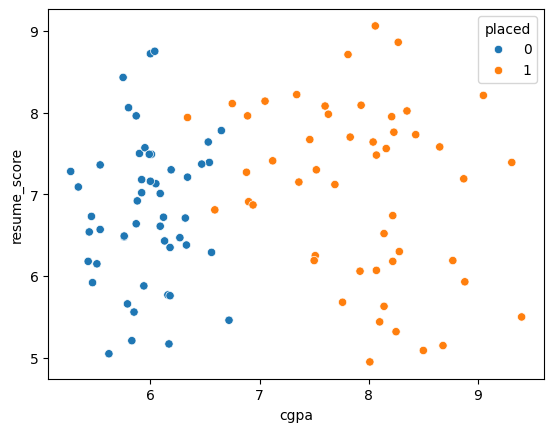

In [ ]:
sns.scatterplot(x=data['cgpa'], y=data['resume_score'], hue=data['placed'])

In [ ]:
# x = data.iloc[:, 0:2]
# y = data.iloc[:, -1]
x = data.drop(['placed'], axis=1)
y = data.placed

In [ ]:
x.head()

,cgpa,resume_score
0,8.14,6.52
1,6.17,5.17
2,8.27,8.86
3,6.88,7.27
4,7.52,7.30


In [ ]:
from sklearn.linear_model import Perceptron
p = Perceptron()

In [ ]:
p.fit(x, y)

Perceptron()

In [ ]:
p.coef_  #(value of w's)

array([[ 40.26, -36.  ]])

In [ ]:
p.intercept_  #(value of b)

array([-25.])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but Perceptron was fitted with feature names
  warnings.warn(


<Axes: >

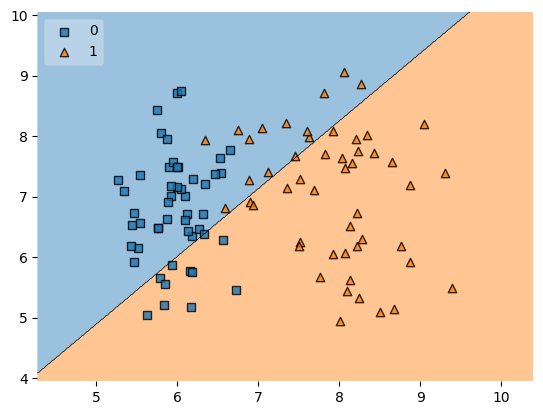

In [ ]:
from mlxtend.plotting import plot_decision_regions
plot_decision_regions(x.values, y.values, clf=p, legend=2)

# **Perceptron Trick**

In [41]:
from sklearn.datasets import make_classification
import numpy as np
X, y = make_classification(n_samples=100, n_features=2, n_informative=1,n_redundant=0,
                           n_classes=2, n_clusters_per_class=1, random_state=41,hypercube=False,class_sep=10)

In [42]:
import matplotlib.pyplot as plt

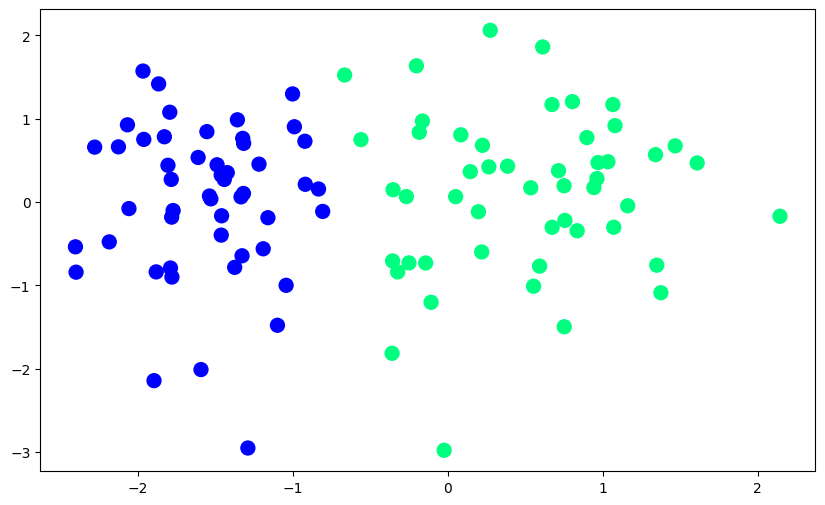

In [3]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)

In [5]:
def perceptron(X,y):

    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1

    for i in range(1000):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]

    return weights[0],weights[1:]

In [6]:
def step(z):
    return 1 if z>0 else 0

In [7]:
intercept_,coef_ = perceptron(X,y)

In [8]:
print(coef_)
print(intercept_)

[1.41132352 0.14205997]
0.9


In [9]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [10]:
x_input = np.linspace(-3,3,100)
y_input = m*x_input + b

(-3.0, 2.0)

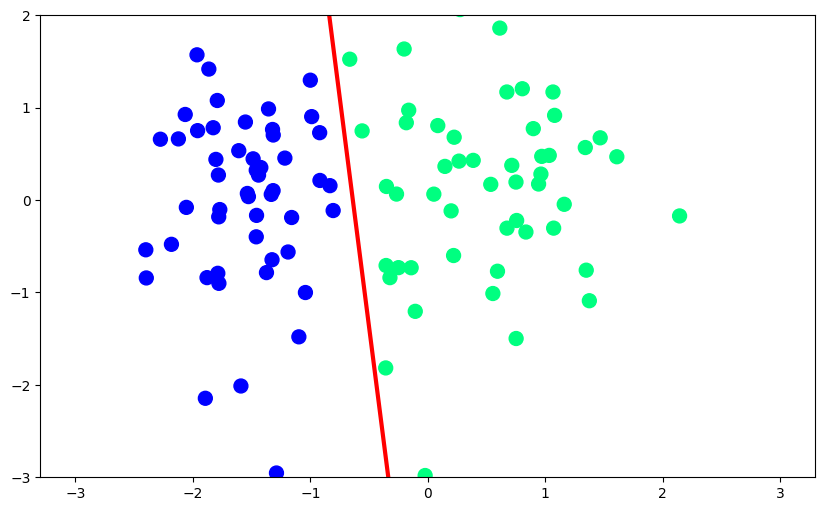

In [11]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

In [45]:
def perceptron(X, y):
    m = []
    b = []

    X = np.insert(X, 0, 1, axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1

    for i in range(200):
        j = np.random.randint(0, 100)
        y_hat = step(np.dot(X[j], weights))
        weights = weights + lr * (y[j] - y_hat) * X[j]

        m.append(-(weights[1] / weights[2]))
        b.append(-(weights[0] / weights[2]))

    return m, b


In [46]:
m,b = perceptron(X,y)

In [20]:
print(m, b)

[-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.1004064096029276, -1.1613910597920345, -1.1613910597920345, -1.1613910597920345, -1.5402121383564829, -1.5402121383564829, -1.5402121383564829, -1.5402121383564829, -1.5402121383564829, -1.5402121383564829, -1.5402121383564829, -1.8199215842955367, -1.8199215842955367, -1.8199215842955367, -1.8199215842955367, -1.8199215842955367, -1.8199215842955367, -2.1616701355904575, -2.1616701355904575, -2.1616701355904575, -2.1616701355904575, -2.1616701355904575, -2.1616701355904575, -2.1616701355904575, -2.1616701355904575, -2.1616701355904575, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -3.9477567467964265, -7.

In [47]:
%matplotlib notebook
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from IPython.display import HTML

In [50]:
fig, ax = plt.subplots(figsize=(9, 5))

x_i = np.arange(-3, 3, 0.1)
y_i = x_i * m[0] + b[0]

ax.scatter(X[:, 0], X[:, 1], c=y, cmap='winter', s=100)
line, = ax.plot(x_i, x_i * m[0] + b[0], 'r-', linewidth=2)
plt.ylim(-3, 3)

def update(i):
    label = 'epoch {0}'.format(i + 1)
    line.set_ydata(x_i * m[i] + b[i])
    ax.set_xlabel(label)
    return line, ax

anim = FuncAnimation(fig, update, repeat=True, frames=200, interval=100)
HTML(anim.to_jshtml())

<IPython.core.display.Javascript object>

/usr/local/lib/python3.10/dist-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(
